# Geometric Alignment Investigation: RGB + Thermal WiSARD

## Research Question

> Are the RGB and thermal images in the WiSARD dataset geometrically aligned, and what type of spatial/feature alignment is appropriate for our multimodal UAV Search and Rescue detector?

This notebook is an investigation, not a training notebook. We will read the original dataset in its current location, measure relationships between the two camera streams, and save only figures and tables outside the dataset. We will not move, copy, rename, preprocess, or modify any source image or annotation.

### Why this question matters
A visible-light RGB camera records color and brightness. A thermal camera records infrared radiation related to heat. Both cameras may look at the same person, but they do not necessarily use the same lens, viewpoint, resolution, field of view, or pixel coordinate system. Resizing two files to the same array shape only makes their arrays the same size; it does not prove that corresponding physical points occupy corresponding pixels.

We will distinguish carefully between:
- **Resolution handling:** changing the number of pixels used for computation.
- **Aspect-ratio handling:** preserving the shape of the image while resizing or adding padding.
- **Geometric alignment:** estimating how coordinates in one camera map to coordinates in the other camera.
- **Feature alignment:** learning or computing representations that correspond even when raw pixels and appearances differ.
- **Cross-modal fusion:** combining information after choosing how the two modalities should interact.

The final recommendation will be based only on the experiments below. A result from a computer-vision algorithm is evidence to inspect, not automatic proof that registration succeeded.

## Notebook roadmap and evidence rules

We will proceed in stages so that the reasoning is visible:

1. Discover folders, files, frame identifiers, image sizes, and the pairing rule.
2. Display representative pairs without stretching either source image.
3. Compare direct stretching with aspect-ratio-preserving resize plus padding.
4. Convert YOLO annotations into pixel boxes and compare person centers using explicit matching assumptions.
5. Make common-coordinate overlays for visual investigation.
6. Test no transform, translation, similarity, affine, and conditionally homography.
7. Test whether conventional ORB feature matching is useful across modalities.
8. Check whether estimated relationships are stable across the sequence.

For every experiment we will separate **OBSERVATION** (a measured value), **INTERPRETATION** (what it may suggest), **CONCLUSION** (what the evidence justifies), and **RECOMMENDATION** (what to investigate next).

In [1]:
# The imports are deliberately explicit so a beginner can see which tool does what.
# pathlib handles safe filesystem paths, OpenCV handles image operations,
# NumPy handles numeric arrays, Pandas handles tables, and Matplotlib
# creates figures that let us inspect the evidence visually.
from pathlib import Path
import re
import random
from dataclasses import dataclass

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

print(f'OpenCV version: {cv2.__version__}')
print(f'NumPy version: {np.__version__}')
print(f'Pandas version: {pd.__version__}')

OpenCV version: 5.0.0
NumPy version: 2.5.2
Pandas version: 3.0.5


## Step 1 - Discover the dataset and verify the pairing

The notebook is stored inside the project repository, but the dataset is intentionally outside it at `D:/Hackathons/miniproject5sem/WiSARD_Multi_Modal_Sample`. We discover modality folders by inspecting directory names rather than hard-coding individual image filenames.

A **frame identifier** is the final number in a filename. The audit found that visible files use frames `0..263`, while infrared files use `1..264`. We will test candidate offsets and accept an offset only when it creates a complete one-to-one set relationship. This matters because pairing the wrong frames would make every later alignment measurement misleading.

**Input:** the existing folder tree, JPEG files, and YOLO text files.

**Output:** discovered paths, counts, dimensions, frame ranges, and a verified pairing table.

**Assumption:** a filename's final numeric token identifies its temporal frame. This is supported by the previous audit, but it is still recorded explicitly rather than hidden.

In [2]:
# Resolve the project and dataset paths without changing the dataset.
# From this notebook: parents[0] is notebooks, parents[1] is the project,
# and parents[2] is the workspace folder containing the external dataset.
NOTEBOOK_PATH = Path.cwd()
PROJECT_ROOT = NOTEBOOK_PATH.parent if NOTEBOOK_PATH.name == 'notebooks' else Path('D:/Hackathons/miniproject5sem/UAV-Search-and-Rescue')
DATASET_ROOT = Path('D:/Hackathons/miniproject5sem/WiSARD_Multi_Modal_Sample')
if not DATASET_ROOT.exists():
    DATASET_ROOT = PROJECT_ROOT.parent / 'WiSARD_Multi_Modal_Sample'

AUDIT_OUTPUT = PROJECT_ROOT / 'results' / 'geometric_alignment'
FIGURE_OUTPUT = PROJECT_ROOT / 'results' / 'visualizations' / 'geometric_alignment'
AUDIT_OUTPUT.mkdir(parents=True, exist_ok=True)
FIGURE_OUTPUT.mkdir(parents=True, exist_ok=True)

assert DATASET_ROOT.exists(), f'Dataset not found: {DATASET_ROOT}'
print(f'Dataset read location: {DATASET_ROOT.resolve()}')
print(f'Investigation tables will be written to: {AUDIT_OUTPUT.resolve()}')
print(f'Investigation figures will be written to: {FIGURE_OUTPUT.resolve()}')
print('Dataset writes: none')

Dataset read location: D:\Hackathons\miniproject5sem\WiSARD_Multi_Modal_Sample
Investigation tables will be written to: D:\Hackathons\miniproject5sem\UAV-Search-and-Rescue\results\geometric_alignment
Investigation figures will be written to: D:\Hackathons\miniproject5sem\UAV-Search-and-Rescue\results\visualizations\geometric_alignment
Dataset writes: none


In [3]:
# A small record keeps the path and frame number together.
# Keeping these values together reduces mistakes when we later construct pairs.
@dataclass
class FrameFile:
    frame_id: int
    path: Path

FRAME_PATTERN = re.compile(r'_(\d+)$')

def extract_frame_id(path):
    # Why? We need a numeric key so RGB frame 0 can be matched to
    # the corresponding thermal frame without comparing whole filenames.
    match = FRAME_PATTERN.search(path.stem)
    return int(match.group(1)) if match else None

def discover_modality_folder(root, keywords):
    # We inspect folder names and select the folder containing a modality keyword.
    # The function raises an error instead of silently selecting the wrong folder.
    matches = [folder for folder in root.iterdir() if folder.is_dir() and any(keyword in folder.name.upper() for keyword in keywords)]
    if len(matches) != 1:
        raise RuntimeError(f'Expected one folder for {keywords}, found: {matches}')
    return matches[0]

def discover_frames(folder):
    # Only image suffixes are considered images. count.txt is metadata,
    # not an object annotation, so it must never enter this dictionary.
    frames = {}
    for path in sorted(folder.rglob('*')):
        if path.is_file() and path.suffix.lower() in {'.jpeg', '.jpg', '.png'}:
            frame_id = extract_frame_id(path)
            if frame_id is not None:
                frames[frame_id] = FrameFile(frame_id, path)
    return frames

def discover_annotations(folder):
    # Annotation files have the same frame token as their image.
    # count.txt is explicitly excluded because it summarizes the folder.
    annotations = {}
    for path in sorted(folder.rglob('*.txt')):
        if path.name.lower() == 'count.txt':
            continue
        frame_id = extract_frame_id(path)
        if frame_id is not None:
            annotations[frame_id] = path
    return annotations

rgb_folder = discover_modality_folder(DATASET_ROOT, ('VIS', 'RGB'))
thermal_folder = discover_modality_folder(DATASET_ROOT, ('IR', 'THERM'))
rgb_frames = discover_frames(rgb_folder)
thermal_frames = discover_frames(thermal_folder)
rgb_annotations = discover_annotations(rgb_folder)
thermal_annotations = discover_annotations(thermal_folder)

# Test several small offsets. A complete equality of frame sets is stronger
# evidence than simply assuming that equal-looking names represent a pair.
offset_candidates = [offset for offset in range(-3, 4) if {frame + offset for frame in rgb_frames} == set(thermal_frames)]
if len(offset_candidates) != 1:
    raise RuntimeError(f'Could not identify one unique complete pairing offset: {offset_candidates}')
PAIR_OFFSET = offset_candidates[0]
pair_rows = []
for rgb_frame_id in sorted(rgb_frames):
    thermal_frame_id = rgb_frame_id + PAIR_OFFSET
    pair_rows.append({
        'rgb_frame': rgb_frame_id,
        'thermal_frame': thermal_frame_id,
        'rgb_path': str(rgb_frames[rgb_frame_id].path),
        'thermal_path': str(thermal_frames[thermal_frame_id].path),
        'rgb_annotation': str(rgb_annotations.get(rgb_frame_id, '')),
        'thermal_annotation': str(thermal_annotations.get(thermal_frame_id, '')),
        'complete_pair': rgb_frame_id in rgb_annotations and thermal_frame_id in thermal_annotations,
    })
pair_table = pd.DataFrame(pair_rows)

def read_dimensions(frame_file):
    # IMREAD_UNCHANGED lets us inspect the stored dimensions without
    # resizing or rewriting the source image.
    image = cv2.imread(str(frame_file.path), cv2.IMREAD_UNCHANGED)
    if image is None:
        return None
    height, width = image.shape[:2]
    return width, height

rgb_dimensions = {frame: read_dimensions(record) for frame, record in rgb_frames.items()}
thermal_dimensions = {frame: read_dimensions(record) for frame, record in thermal_frames.items()}
summary = pd.DataFrame({
    'item': ['RGB folder', 'Thermal folder', 'RGB images', 'Thermal images', 'RGB annotations', 'Thermal annotations', 'Pair offset', 'Complete pairs', 'RGB dimensions', 'Thermal dimensions'],
    'value': [rgb_folder.name, thermal_folder.name, len(rgb_frames), len(thermal_frames), len(rgb_annotations), len(thermal_annotations), PAIR_OFFSET, int(pair_table.complete_pair.sum()), sorted(set(rgb_dimensions.values())), sorted(set(thermal_dimensions.values()))],
})
display(summary)
pair_table.head()

,item,value
0,RGB folder,210417_MtErie_Enterprise_VIS_0003
1,Thermal folder,210417_MtErie_Enterprise_IR_0004
2,RGB images,264
3,Thermal images,264
4,RGB annotations,264
5,Thermal annotations,264
6,Pair offset,1
7,Complete pairs,264
8,RGB dimensions,"[(3840, 2160)]"
9,Thermal dimensions,"[(640, 512)]"


,rgb_frame,thermal_frame,rgb_path,thermal_path,rgb_annotation,thermal_annotation,complete_pair
0,0,1,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,True
1,1,2,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,True
2,2,3,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,True
3,3,4,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,True
4,4,5,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,D:\Hackathons\miniproject5sem\WiSARD_Multi_Mod...,True


### What does this tell us?

The discovery stage should reproduce the audited facts: 264 visible images, 264 thermal images, 264 annotations per modality, and a one-frame relationship where `thermal_frame = rgb_frame + 1`. The pairing rule is a temporal/file relationship, not yet a geometric alignment result. Even perfectly paired timestamps can come from cameras with different viewpoints.

**Observation:** the table above reports what was actually found.

**Interpretation:** a complete pair table lets us compare corresponding moments without accidentally comparing unrelated frames.

**Conclusion:** later geometric measurements are meaningful only for these verified pairs.

## Step 2 - Display representative pairs and their boxes

A **bounding box** is a rectangle around an annotated object. WiSARD stores each box in normalized YOLO form: `class_id, center_x, center_y, width, height`, where the four coordinates are fractions between 0 and 1. A center of `(0.5, 0.5)` means the center is halfway across and halfway down that image.

We will display the first, early, quarter, middle, three-quarter, late, and final verified pairs. Each source image keeps its own aspect ratio; we do not stretch the RGB pixels to the thermal shape. The figures provide qualitative evidence about field of view and obvious spatial offsets before numerical fitting.

**Important limitation:** a box around the same person in two cameras is not automatically a pixel-to-pixel correspondence. The cameras may see different portions of the scene, and the annotation rectangles may have different tightness.

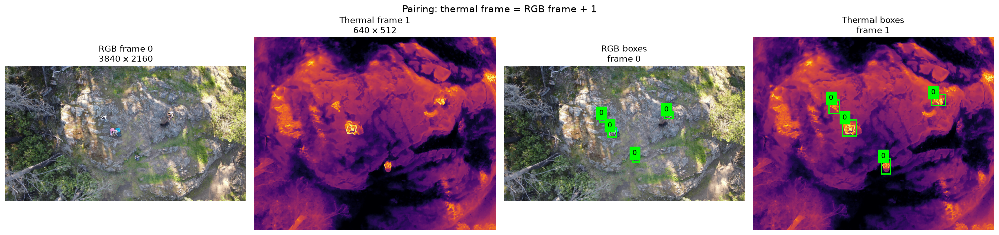

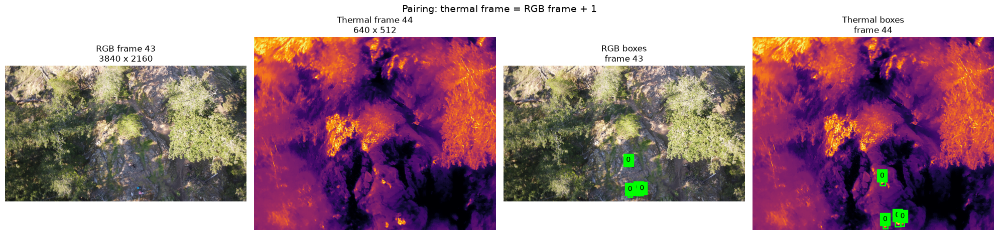

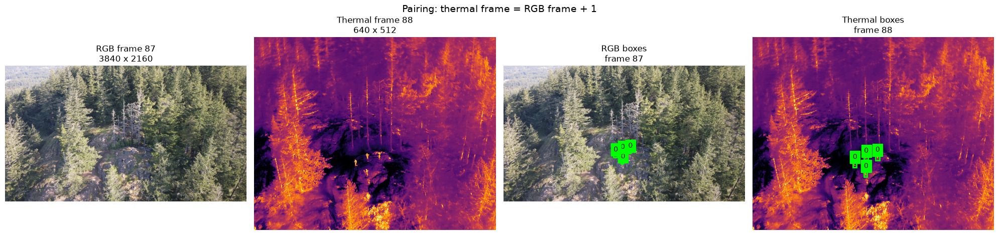

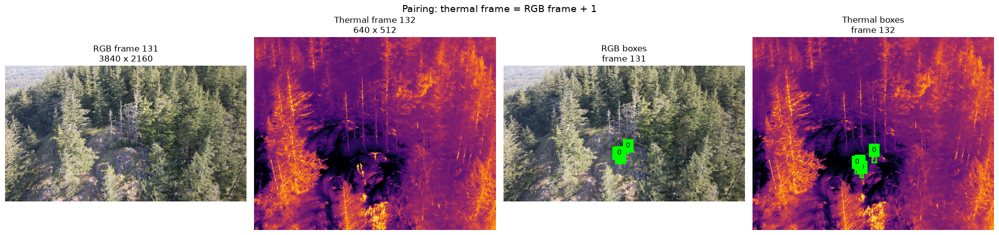

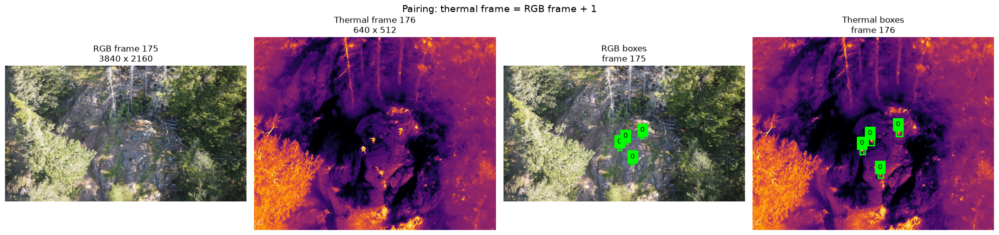

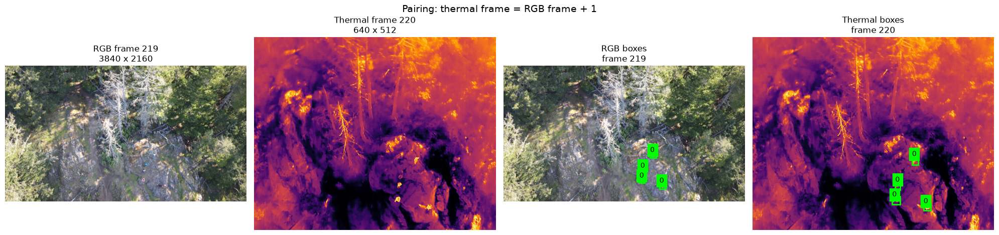

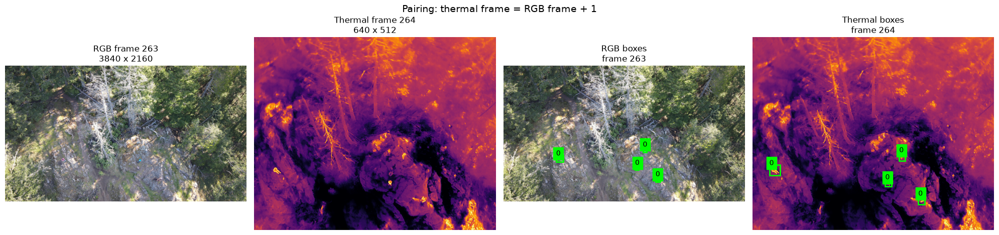

In [4]:
def read_yolo_boxes(annotation_path):
    # YOLO uses normalized coordinates. We preserve those values here
    # and convert them to pixels only after loading the corresponding image.
    boxes = []
    if not annotation_path or not Path(annotation_path).exists():
        return boxes
    for line in Path(annotation_path).read_text(encoding='utf-8', errors='replace').splitlines():
        fields = line.split()
        if len(fields) != 5:
            continue
        try:
            class_id = int(fields[0])
            center_x, center_y, width, height = map(float, fields[1:])
        except ValueError:
            continue
        boxes.append((class_id, center_x, center_y, width, height))
    return boxes

def yolo_to_pixel_boxes(yolo_boxes, image_shape):
    # Why convert? Normalized coordinates cannot be compared to actual
    # pixel locations until they are multiplied by this image's own size.
    image_height, image_width = image_shape[:2]
    pixel_boxes = []
    for class_id, center_x, center_y, width, height in yolo_boxes:
        left = (center_x - width / 2) * image_width
        top = (center_y - height / 2) * image_height
        right = (center_x + width / 2) * image_width
        bottom = (center_y + height / 2) * image_height
        pixel_boxes.append({'class_id': class_id, 'left': left, 'top': top, 'right': right, 'bottom': bottom, 'center_x': center_x * image_width, 'center_y': center_y * image_height, 'width': width * image_width, 'height': height * image_height})
    return pixel_boxes

def draw_boxes(axis, image, boxes, title):
    # Matplotlib displays the image using its natural aspect ratio.
    # Rectangle coordinates are pixels in the image's own coordinate system.
    axis.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB) if image.ndim == 3 else image, cmap='inferno' if image.ndim == 2 else None)
    for box in boxes:
        rectangle = plt.Rectangle((box['left'], box['top']), box['width'], box['height'], fill=False, edgecolor='lime', linewidth=2)
        axis.add_patch(rectangle)
        axis.text(box['left'], box['top'], str(box['class_id']), color='black', backgroundcolor='lime')
    axis.set_title(title)
    axis.set_axis_off()

def load_pair(pair_row):
    # We read each file independently. No image is saved back to the dataset.
    rgb_image = cv2.imread(pair_row.rgb_path, cv2.IMREAD_COLOR)
    thermal_image = cv2.imread(pair_row.thermal_path, cv2.IMREAD_GRAYSCALE)
    if rgb_image is None or thermal_image is None:
        raise ValueError(f'Unreadable pair: {pair_row.rgb_frame}, {pair_row.thermal_frame}')
    rgb_boxes = yolo_to_pixel_boxes(read_yolo_boxes(pair_row.rgb_annotation), rgb_image.shape)
    thermal_boxes = yolo_to_pixel_boxes(read_yolo_boxes(pair_row.thermal_annotation), thermal_image.shape)
    return rgb_image, thermal_image, rgb_boxes, thermal_boxes

representative_positions = np.linspace(0, len(pair_table) - 1, 7, dtype=int)
representative_pairs = pair_table.iloc[representative_positions].drop_duplicates('rgb_frame')
for _, pair_row in representative_pairs.iterrows():
    rgb_image, thermal_image, rgb_boxes, thermal_boxes = load_pair(pair_row)
    figure, axes = plt.subplots(1, 4, figsize=(20, 5))
    draw_boxes(axes[0], rgb_image, [], f'RGB frame {pair_row.rgb_frame}\n{rgb_image.shape[1]} x {rgb_image.shape[0]}')
    draw_boxes(axes[1], thermal_image, [], f'Thermal frame {pair_row.thermal_frame}\n{thermal_image.shape[1]} x {thermal_image.shape[0]}')
    draw_boxes(axes[2], rgb_image, rgb_boxes, f'RGB boxes\nframe {pair_row.rgb_frame}')
    draw_boxes(axes[3], thermal_image, thermal_boxes, f'Thermal boxes\nframe {pair_row.thermal_frame}')
    figure.suptitle(f'Pairing: thermal frame = RGB frame + {PAIR_OFFSET}', fontsize=14)
    figure.tight_layout()
    figure.savefig(FIGURE_OUTPUT / f'representative_pair_{int(pair_row.rgb_frame):04d}.png', dpi=140, bbox_inches='tight')
    plt.show()
    plt.close(figure)

### What does this tell us?

Look for three things: whether the two images show the same broad scene, whether their fields of view include the same people, and whether the rectangles appear similarly placed after accounting for each image's own dimensions. A person can be visible in both images while still having different normalized coordinates because the cameras have different crops or viewpoints.

**Observation:** the figures show source images at their native proportions and their independent annotations.

**Interpretation:** visual similarity of scene content is weaker evidence than consistent coordinate correspondence.

**Conclusion:** these plots motivate quantitative comparisons, but they do not by themselves prove registration.

## Step 3 - Aspect ratio, direct stretching, and letterboxing

The **aspect ratio** is width divided by height. RGB is `3840 / 2160 = 1.778`, while thermal is `640 / 512 = 1.25`. If we force both images into one rectangle, a direct resize changes horizontal and vertical scale by different amounts. A person can become wider or narrower in the display, and a geometric measurement made after that distortion is not a measurement of the original cameras.

**Letterboxing** means resizing an image with one uniform scale factor and filling the unused area with padding. It preserves shapes and straight-line geometry, but the padding is not real scene content and must be tracked.

We compare both methods only to explain the visualization problem. All quantitative annotation and transformation measurements below use each modality's native coordinates or explicitly documented normalized coordinates, never a distorted image.

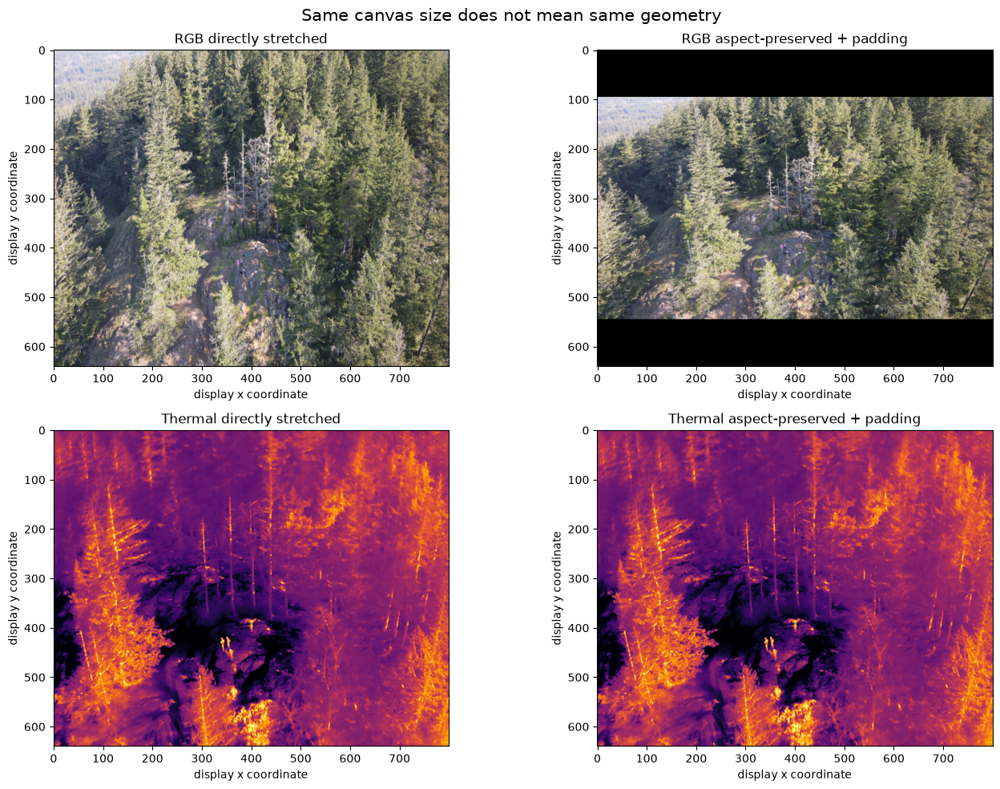

RGB aspect ratio: 1.7777777777777777
Thermal aspect ratio: 1.25
RGB letterbox parameters: {'scale': 0.20833333333333334, 'pad_left': 0, 'pad_top': 95, 'content_width': 800, 'content_height': 450}
Thermal letterbox parameters: {'scale': 1.25, 'pad_left': 0, 'pad_top': 0, 'content_width': 800, 'content_height': 640}


In [5]:
def direct_stretch(image, target_size):
    # This operation is intentionally shown as a cautionary example.
    # It gives equal array dimensions but uses different x/y scale factors.
    target_width, target_height = target_size
    return cv2.resize(image, (target_width, target_height), interpolation=cv2.INTER_AREA)

def aspect_preserving_letterbox(image, target_size, pad_value=0):
    # One scale factor is used for both axes so object shapes are not stretched.
    # Padding records the empty border required to fill the target canvas.
    target_width, target_height = target_size
    original_height, original_width = image.shape[:2]
    scale = min(target_width / original_width, target_height / original_height)
    resized_width = max(1, round(original_width * scale))
    resized_height = max(1, round(original_height * scale))
    resized = cv2.resize(image, (resized_width, resized_height), interpolation=cv2.INTER_AREA)
    canvas = np.full((target_height, target_width), pad_value, dtype=resized.dtype) if image.ndim == 2 else np.full((target_height, target_width, image.shape[2]), pad_value, dtype=resized.dtype)
    left = (target_width - resized_width) // 2
    top = (target_height - resized_height) // 2
    canvas[top:top + resized_height, left:left + resized_width] = resized
    return canvas, {'scale': scale, 'pad_left': left, 'pad_top': top, 'content_width': resized_width, 'content_height': resized_height}

demo_pair = pair_table.iloc[len(pair_table) // 2]
rgb_demo, thermal_demo, _, _ = load_pair(demo_pair)
common_size = (800, 640)
stretched_rgb = direct_stretch(rgb_demo, common_size)
letterboxed_rgb, rgb_letterbox_info = aspect_preserving_letterbox(rgb_demo, common_size)
stretched_thermal = direct_stretch(thermal_demo, common_size)
letterboxed_thermal, thermal_letterbox_info = aspect_preserving_letterbox(thermal_demo, common_size)

figure, axes = plt.subplots(2, 2, figsize=(14, 10))
axes[0, 0].imshow(cv2.cvtColor(stretched_rgb, cv2.COLOR_BGR2RGB)); axes[0, 0].set_title('RGB directly stretched')
axes[0, 1].imshow(cv2.cvtColor(letterboxed_rgb, cv2.COLOR_BGR2RGB)); axes[0, 1].set_title('RGB aspect-preserved + padding')
axes[1, 0].imshow(stretched_thermal, cmap='inferno'); axes[1, 0].set_title('Thermal directly stretched')
axes[1, 1].imshow(letterboxed_thermal, cmap='inferno'); axes[1, 1].set_title('Thermal aspect-preserved + padding')
for axis in axes.flat:
    axis.set_xlabel('display x coordinate'); axis.set_ylabel('display y coordinate')
figure.suptitle('Same canvas size does not mean same geometry', fontsize=15)
figure.tight_layout()
figure.savefig(FIGURE_OUTPUT / 'aspect_ratio_comparison.png', dpi=140, bbox_inches='tight')
plt.show()
plt.close(figure)
print('RGB aspect ratio:', rgb_demo.shape[1] / rgb_demo.shape[0])
print('Thermal aspect ratio:', thermal_demo.shape[1] / thermal_demo.shape[0])
print('RGB letterbox parameters:', rgb_letterbox_info)
print('Thermal letterbox parameters:', thermal_letterbox_info)

### What does this tell us?

Direct stretching can make two arrays look conveniently comparable while silently changing the geometry of objects. Letterboxing preserves each image's shape, but the resulting padded canvases still do not prove that the cameras are registered.

**Observation:** the source aspect ratios are different, and the direct-stretch and letterbox views visibly have different object shapes and padding.

**Interpretation:** any visualization or model pipeline that uses a common canvas must record its scale and padding.

**Conclusion:** aspect-ratio preservation is necessary for honest visualization, but it is separate from estimating the camera-to-camera transformation.

## Step 4 - Normalized bounding-box correspondence

We now use annotations as possible object-level evidence. A YOLO box is converted into pixels using the image's own width and height. We also retain normalized centers because normalized coordinates provide a common fractional coordinate system for an exploratory comparison.

We must not blindly match box number 1 in RGB to box number 1 in thermal. Annotation order can change. Instead, for each paired frame we compare boxes of the same class using greedy nearest-neighbor matching in normalized center space, with a maximum distance threshold. This is a practical exploratory heuristic, not proof that two boxes describe the same person. A reliable identity match would require additional evidence such as calibrated geometry, tracking, or manual correspondence.

**IoU**, or intersection over union, is the area shared by two boxes divided by the area covered by either box. It is useful when two boxes are already in the same coordinate system. Here the native RGB and thermal pixels are not the same coordinate system, so native-pixel IoU is not meaningful until a mapping has been estimated.

Potential center-based correspondences: 992


,rgb_frame,thermal_frame,rgb_box_index,thermal_box_index,rgb_center_x_norm,rgb_center_y_norm,thermal_center_x_norm,thermal_center_y_norm,center_displacement_norm,width_difference_norm,height_difference_norm,class_id
count,992.000000,992.000000,992.000000,992.000000,992.000000,992.000000,992.000000,992.000000,992.000000,992.000000,992.000000,992.0
mean,129.831653,130.831653,1.458669,1.473790,0.519212,0.595462,0.511636,0.583661,0.046557,0.007153,0.006201,0.0
std,76.865031,76.865031,1.119637,1.119193,0.079134,0.171134,0.120233,0.183490,0.036753,0.004315,0.005002,0.0
min,0.000000,1.000000,0.000000,0.000000,0.230544,0.027778,0.080078,0.016667,0.002445,0.000000,0.000000,0.0
25%,65.000000,66.000000,0.000000,0.000000,0.475781,0.510622,0.443750,0.489583,0.023312,0.003906,0.002777,0.0
50%,127.000000,128.000000,1.000000,1.000000,0.503906,0.628666,0.489536,0.620139,0.034816,0.006250,0.005555,0.0
75%,195.000000,196.000000,2.000000,2.000000,0.551358,0.705577,0.562109,0.704560,0.058463,0.009375,0.008334,0.0
max,263.000000,264.000000,3.000000,3.000000,0.827344,0.979861,0.965625,0.981250,0.198096,0.032031,0.034723,0.0


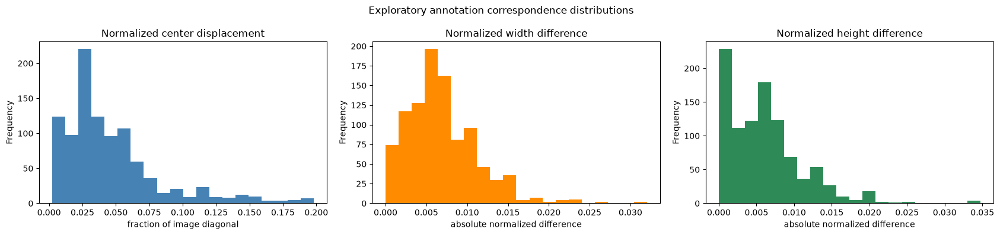

In [6]:
def match_boxes_by_normalized_center(rgb_boxes, thermal_boxes, max_distance=0.20):
    # Both lists use normalized center coordinates, so distance is measured
    # as a fraction of the image width/height rather than raw pixels.
    # The greedy algorithm prevents using one thermal box twice.
    available = set(range(len(thermal_boxes)))
    matches = []
    for rgb_index, rgb_box in enumerate(rgb_boxes):
        candidates = [(index, thermal_boxes[index]) for index in available if thermal_boxes[index]['class_id'] == rgb_box['class_id']]
        if not candidates:
            continue
        distances = [(index, float(np.hypot(rgb_box['center_x_norm'] - box['center_x_norm'], rgb_box['center_y_norm'] - box['center_y_norm']))) for index, box in candidates]
        thermal_index, distance = min(distances, key=lambda item: item[1])
        if distance <= max_distance:
            matches.append((rgb_index, thermal_index, distance))
            available.remove(thermal_index)
    return matches

def normalized_boxes(annotation_path):
    # Keep normalized values and add explicit names. Named fields make the
    # later calculations readable to someone learning computer vision.
    boxes = []
    for class_id, center_x, center_y, width, height in read_yolo_boxes(annotation_path):
        boxes.append({'class_id': class_id, 'center_x_norm': center_x, 'center_y_norm': center_y, 'width_norm': width, 'height_norm': height})
    return boxes

correspondence_rows = []
for _, pair_row in pair_table.iterrows():
    rgb_boxes = normalized_boxes(pair_row.rgb_annotation)
    thermal_boxes = normalized_boxes(pair_row.thermal_annotation)
    matches = match_boxes_by_normalized_center(rgb_boxes, thermal_boxes)
    for rgb_index, thermal_index, center_distance in matches:
        rgb_box = rgb_boxes[rgb_index]
        thermal_box = thermal_boxes[thermal_index]
        correspondence_rows.append({
            'rgb_frame': pair_row.rgb_frame, 'thermal_frame': pair_row.thermal_frame,
            'rgb_box_index': rgb_index, 'thermal_box_index': thermal_index,
            'rgb_center_x_norm': rgb_box['center_x_norm'], 'rgb_center_y_norm': rgb_box['center_y_norm'],
            'thermal_center_x_norm': thermal_box['center_x_norm'], 'thermal_center_y_norm': thermal_box['center_y_norm'],
            'center_displacement_norm': center_distance,
            'width_difference_norm': abs(rgb_box['width_norm'] - thermal_box['width_norm']),
            'height_difference_norm': abs(rgb_box['height_norm'] - thermal_box['height_norm']),
            'class_id': rgb_box['class_id'],
        })
correspondence_table = pd.DataFrame(correspondence_rows)
correspondence_table.to_csv(AUDIT_OUTPUT / 'bounding_box_correspondence.csv', index=False)
print(f'Potential center-based correspondences: {len(correspondence_table)}')
display(correspondence_table.describe(include='all'))

if not correspondence_table.empty:
    figure, axes = plt.subplots(1, 3, figsize=(17, 4))
    correspondence_table['center_displacement_norm'].plot.hist(ax=axes[0], bins=20, color='steelblue')
    correspondence_table['width_difference_norm'].plot.hist(ax=axes[1], bins=20, color='darkorange')
    correspondence_table['height_difference_norm'].plot.hist(ax=axes[2], bins=20, color='seagreen')
    axes[0].set_title('Normalized center displacement'); axes[0].set_xlabel('fraction of image diagonal')
    axes[1].set_title('Normalized width difference'); axes[1].set_xlabel('absolute normalized difference')
    axes[2].set_title('Normalized height difference'); axes[2].set_xlabel('absolute normalized difference')
    figure.suptitle('Exploratory annotation correspondence distributions')
    figure.tight_layout()
    figure.savefig(FIGURE_OUTPUT / 'bounding_box_correspondence_distributions.png', dpi=140, bbox_inches='tight')
    plt.show()
    plt.close(figure)

### What does this tell us?

The correspondence table describes **potential** pairs selected by proximity in normalized coordinates. A small normalized displacement would suggest that object centers are broadly consistent after each image is reduced to fractional coordinates. A large or widely spread displacement would suggest different crops, fields of view, or camera geometry.

**Observation:** use the count and histogram above, not the matching algorithm's existence, as the evidence.

**Interpretation:** a greedy center match can be useful for exploratory statistics, but it can create false matches when several people are close together.

**Conclusion:** these measurements can suggest whether a simple global relationship is plausible, but they cannot alone establish physical correspondence or calibration.

## Step 5 - Common-coordinate overlays

An overlay places two images on one display coordinate system with transparency. Here we use aspect-preserving letterboxing only to create a fair visual canvas. We treat RGB as the reference display canvas and place the thermal image beside it in a shared padded canvas; this is an investigation visualization, not a claim that the cameras are registered.

We also draw thermal boxes in their own panel. Projecting a thermal box onto RGB pixels without a measured transformation would be misleading, so the code below intentionally labels any side-by-side/common-canvas view as visualization-only.

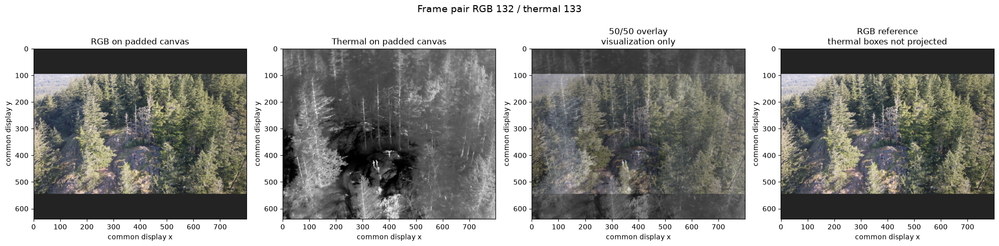

In [7]:
def grayscale_to_rgb(image):
    # A thermal grayscale image is repeated into three channels only for
    # visualization. This does not change the thermal measurement itself.
    return cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

overlay_pair = pair_table.iloc[len(pair_table) // 2]
rgb_image, thermal_image, rgb_boxes, thermal_boxes = load_pair(overlay_pair)
rgb_rgb = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB)
thermal_rgb = grayscale_to_rgb(thermal_image)
display_size = (800, 640)
rgb_canvas, rgb_info = aspect_preserving_letterbox(rgb_rgb, display_size, pad_value=35)
thermal_canvas, thermal_info = aspect_preserving_letterbox(thermal_rgb, display_size, pad_value=35)
# Alpha blending is a visualization operation: it makes both images visible
# at once, but it does not make their pixels physically corresponding.
blend = cv2.addWeighted(rgb_canvas, 0.5, thermal_canvas, 0.5, 0)

figure, axes = plt.subplots(1, 4, figsize=(20, 5))
axes[0].imshow(rgb_canvas); axes[0].set_title('RGB on padded canvas')
axes[1].imshow(thermal_canvas, cmap='inferno'); axes[1].set_title('Thermal on padded canvas')
axes[2].imshow(blend); axes[2].set_title('50/50 overlay\nvisualization only')
axes[3].imshow(rgb_canvas); axes[3].set_title('RGB reference\nthermal boxes not projected')
for axis in axes:
    axis.set_xlabel('common display x'); axis.set_ylabel('common display y')
figure.suptitle(f'Frame pair RGB {overlay_pair.rgb_frame} / thermal {overlay_pair.thermal_frame}', fontsize=14)
figure.tight_layout()
figure.savefig(FIGURE_OUTPUT / 'common_canvas_overlay.png', dpi=140, bbox_inches='tight')
plt.show()
plt.close(figure)

### What does this tell us?

Overlays are useful for spotting gross differences such as a crop, field-of-view mismatch, or obvious offset. They are not a calibration procedure. The padded canvas has a display scale and padding for each modality, and those values are different.

**Observation:** the overlay shows how scene content relates visually after aspect-preserving display normalization.

**Interpretation:** ghosting, duplicated edges, or a person appearing in different places can indicate misregistration, but thermal/RGB appearance differences can also create visual disagreement.

**Conclusion:** overlays motivate transformation tests; they do not establish a valid transformation by themselves.

## Step 6 - Test progressively more flexible geometric transformations

A geometric transformation is a rule that maps a point from one coordinate system into another:

- **No transformation:** corresponding points already have the same coordinates.
- **Translation:** moves every point by the same horizontal and vertical amount.
- **Similarity:** translation plus one uniform scale and rotation; shapes keep their proportions.
- **Affine transformation:** adds independent x/y scaling and shearing while keeping straight lines straight and parallel lines parallel.
- **Homography:** a projective mapping that can model perspective effects; it needs reliable point correspondences and is more flexible, so it can also overfit bad matches.

We estimate these mappings from the potential annotation-center correspondences in normalized coordinates. This is deliberately conservative: if correspondence quality is weak, the transform result is reported as uncertain rather than treated as truth. **RANSAC** is a robust estimation method that repeatedly fits a model to subsets and tries to reject outliers. It helps when some proposed correspondences are wrong, but RANSAC cannot rescue a dataset with no meaningful correspondences.

**Reprojection error** is the distance between a target point and the point predicted by the transformation. Lower error means the chosen points fit that model better; it does not prove that all scene pixels are aligned.

,transformation,count,mean,median,max,inliers_or_points
0,no_transform,992,0.046557,0.034816,0.198096,992
1,translation,992,0.044490,0.034653,0.195672,992
2,similarity_ransac,992,0.037233,0.024299,0.277264,869
3,affine_ransac,992,0.024690,0.009377,0.228365,909
4,homography_ransac,992,0.025963,0.011477,0.224391,913


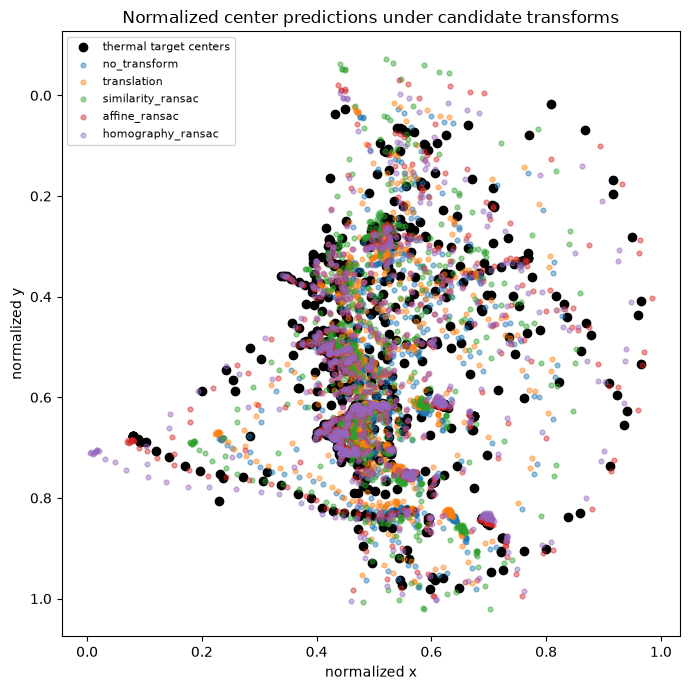

In [8]:
def correspondence_points(table):
    # Annotation centers are already normalized to each image. We use them
    # as exploratory points, while recording that box identity is uncertain.
    if table.empty:
        return np.empty((0, 2), dtype=np.float32), np.empty((0, 2), dtype=np.float32)
    source = table[['rgb_center_x_norm', 'rgb_center_y_norm']].to_numpy(np.float32)
    target = table[['thermal_center_x_norm', 'thermal_center_y_norm']].to_numpy(np.float32)
    return source, target

def apply_transform(matrix, points):
    # Convert 2D points to homogeneous coordinates so affine and projective
    # matrices can be applied using the same clear calculation.
    if len(points) == 0:
        return np.empty((0, 2), dtype=np.float32)
    homogeneous = np.column_stack([points, np.ones(len(points), dtype=np.float32)])
    transformed = homogeneous @ matrix.T
    scale = transformed[:, 2:3]
    scale[scale == 0] = 1e-12
    return transformed[:, :2] / scale

def error_summary(predicted, target):
    # Euclidean distance is measured in normalized-coordinate units.
    # This makes errors comparable across the 3840x2160 and 640x512 images.
    if len(target) == 0:
        return {'count': 0, 'mean': np.nan, 'median': np.nan, 'max': np.nan}
    errors = np.linalg.norm(predicted - target, axis=1)
    return {'count': len(errors), 'mean': float(errors.mean()), 'median': float(np.median(errors)), 'max': float(errors.max())}

def fit_transformations(source, target):
    # Every model is fitted only when enough points exist. Returning a
    # missing model is safer than fabricating a transform from too little data.
    results = []
    identity = np.eye(3, dtype=np.float32)
    results.append(('no_transform', identity, error_summary(source, target), len(source)))
    if len(source) >= 1:
        # A translation estimate is simply the average target-source shift.
        translation = np.eye(3, dtype=np.float32)
        translation[:2, 2] = np.mean(target - source, axis=0)
        results.append(('translation', translation, error_summary(apply_transform(translation, source), target), len(source)))
    if len(source) >= 2:
        similarity, inliers = cv2.estimateAffinePartial2D(source, target, method=cv2.RANSAC, ransacReprojThreshold=0.08)
        if similarity is not None:
            matrix = np.vstack([similarity, [0, 0, 1]]).astype(np.float32)
            results.append(('similarity_ransac', matrix, error_summary(apply_transform(matrix, source), target), int(inliers.sum()) if inliers is not None else 0))
    if len(source) >= 3:
        affine, inliers = cv2.estimateAffine2D(source, target, method=cv2.RANSAC, ransacReprojThreshold=0.08)
        if affine is not None:
            matrix = np.vstack([affine, [0, 0, 1]]).astype(np.float32)
            results.append(('affine_ransac', matrix, error_summary(apply_transform(matrix, source), target), int(inliers.sum()) if inliers is not None else 0))
    if len(source) >= 4:
        homography, inliers = cv2.findHomography(source, target, cv2.RANSAC, 0.08)
        if homography is not None:
            results.append(('homography_ransac', homography.astype(np.float32), error_summary(apply_transform(homography, source), target), int(inliers.sum()) if inliers is not None else 0))
    return results

source_points, target_points = correspondence_points(correspondence_table)
transformation_rows = []
transformation_matrices = {}
for name, matrix, errors, inliers in fit_transformations(source_points, target_points):
    transformation_matrices[name] = matrix
    transformation_rows.append({'transformation': name, **errors, 'inliers_or_points': inliers})
transformation_table = pd.DataFrame(transformation_rows)
transformation_table.to_csv(AUDIT_OUTPUT / 'transformation_comparison.csv', index=False)
display(transformation_table)

if len(source_points) >= 1:
    figure, axis = plt.subplots(figsize=(7, 7))
    axis.scatter(target_points[:, 0], target_points[:, 1], label='thermal target centers', color='black')
    for name in ['no_transform', 'translation', 'similarity_ransac', 'affine_ransac', 'homography_ransac']:
        if name in transformation_matrices:
            predicted = apply_transform(transformation_matrices[name], source_points)
            axis.scatter(predicted[:, 0], predicted[:, 1], s=12, alpha=0.45, label=name)
    axis.set_title('Normalized center predictions under candidate transforms')
    axis.set_xlabel('normalized x'); axis.set_ylabel('normalized y'); axis.legend(fontsize=8)
    axis.invert_yaxis()
    figure.tight_layout()
    figure.savefig(FIGURE_OUTPUT / 'transformation_center_predictions.png', dpi=140, bbox_inches='tight')
    plt.show()
    plt.close(figure)

### What does this tell us?

Compare model error with the number of inliers and with visual plausibility. A more flexible model will almost always fit training correspondences at least as well, especially when the point count is small. That does not mean it will generalize to new frames or align all pixels.

**Observation:** the table reports error for no transform, translation, similarity, affine, and homography when enough points exist.

**Interpretation:** a consistent large reduction from identity to translation would support a global offset; a reduction requiring affine or homography may indicate more complex geometry, but could also reflect false box matches.

**Conclusion:** homography is justified only if reliable correspondences are available and the improvement is stable across frames, not merely because it is the most flexible option.

## Step 7 - Conventional keypoint and feature matching

A **keypoint** is a visually distinctive image location, such as a corner. A **descriptor** is a numeric summary of the local appearance around that keypoint. Feature matching compares descriptors between images. ORB is a fast classical method that detects oriented corners and creates binary descriptors.

This is a difficult test for RGB and thermal data because the same person or object can have very different visible brightness and thermal intensity. We resize both images only for this feature-search experiment, using aspect-preserving letterboxing. We do not treat the resized feature image as a calibrated common pixel grid.

The number of raw matches is not enough. We also measure distance quality and use RANSAC to count geometrically consistent matches. A returned transform with very few inliers or unstable parameters is evidence that conventional matching is unreliable for this pair.

,rgb_frame,thermal_frame,rgb_keypoints,thermal_keypoints,raw_matches,good_matches,ransac_inliers,median_distance
0,0,1,1500,1500,368,100,5,48.0
1,22,23,1500,1500,369,100,23,44.0
2,44,45,1500,1500,401,100,20,47.0
3,66,67,1500,1500,375,100,15,49.0
4,88,89,1500,1500,390,100,11,49.0
5,110,111,1500,1500,415,100,16,49.5
6,132,133,1500,1500,406,100,11,49.0
7,154,155,1500,1500,383,100,30,47.0
8,176,177,1500,1500,396,100,9,49.0
9,198,199,1500,1500,398,100,8,48.0


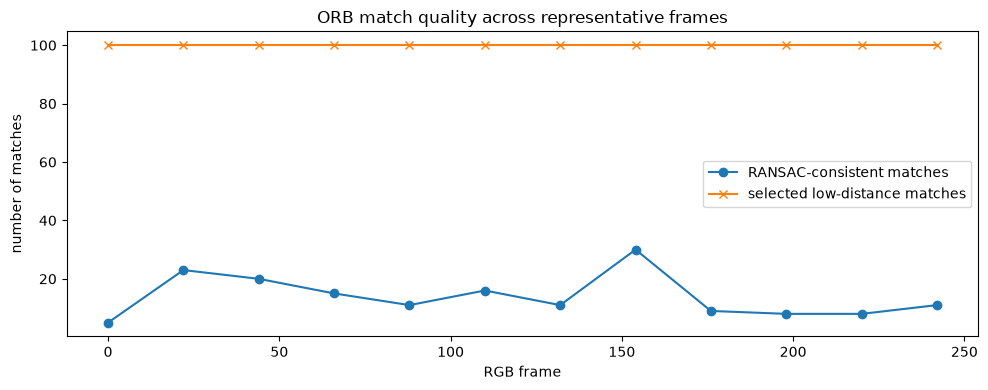

In [9]:
def prepare_feature_image(image, target_size=(800, 640)):
    # ORB needs a single-channel image. We preserve aspect ratio first,
    # then convert the display canvas to grayscale for detector input.
    if image.ndim == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    canvas, info = aspect_preserving_letterbox(image, target_size, pad_value=0)
    return canvas, info

def orb_match_pair(rgb_image, thermal_image):
    # ORB is used as an investigation tool, not as proof of registration.
    rgb_feature_image, _ = prepare_feature_image(rgb_image)
    thermal_feature_image, _ = prepare_feature_image(thermal_image)
    detector = cv2.ORB_create(nfeatures=1500)
    rgb_keypoints, rgb_descriptors = detector.detectAndCompute(rgb_feature_image, None)
    thermal_keypoints, thermal_descriptors = detector.detectAndCompute(thermal_feature_image, None)
    if rgb_descriptors is None or thermal_descriptors is None:
        return {'rgb_keypoints': len(rgb_keypoints), 'thermal_keypoints': len(thermal_keypoints), 'raw_matches': 0, 'good_matches': 0, 'ransac_inliers': 0, 'median_distance': np.nan}
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    raw_matches = sorted(matcher.match(rgb_descriptors, thermal_descriptors), key=lambda match: match.distance)
    good_matches = raw_matches[:max(0, min(100, len(raw_matches)))]
    inliers = 0
    if len(good_matches) >= 4:
        source = np.float32([rgb_keypoints[match.queryIdx].pt for match in good_matches])
        target = np.float32([thermal_keypoints[match.trainIdx].pt for match in good_matches])
        _, mask = cv2.findHomography(source, target, cv2.RANSAC, 5.0)
        inliers = int(mask.sum()) if mask is not None else 0
    return {'rgb_keypoints': len(rgb_keypoints), 'thermal_keypoints': len(thermal_keypoints), 'raw_matches': len(raw_matches), 'good_matches': len(good_matches), 'ransac_inliers': inliers, 'median_distance': float(np.median([match.distance for match in good_matches])) if good_matches else np.nan}

feature_rows = []
for _, pair_row in pair_table.iloc[::max(1, len(pair_table) // 12)].iterrows():
    rgb_image, thermal_image, _, _ = load_pair(pair_row)
    feature_result = orb_match_pair(rgb_image, thermal_image)
    feature_rows.append({'rgb_frame': pair_row.rgb_frame, 'thermal_frame': pair_row.thermal_frame, **feature_result})
feature_table = pd.DataFrame(feature_rows)
feature_table.to_csv(AUDIT_OUTPUT / 'orb_feature_matching.csv', index=False)
display(feature_table)

figure, axis = plt.subplots(figsize=(10, 4))
axis.plot(feature_table.rgb_frame, feature_table.ransac_inliers, marker='o', label='RANSAC-consistent matches')
axis.plot(feature_table.rgb_frame, feature_table.good_matches, marker='x', label='selected low-distance matches')
axis.set_title('ORB match quality across representative frames')
axis.set_xlabel('RGB frame'); axis.set_ylabel('number of matches'); axis.legend()
figure.tight_layout()
figure.savefig(FIGURE_OUTPUT / 'orb_feature_matching_quality.png', dpi=140, bbox_inches='tight')
plt.show()
plt.close(figure)

### What does this tell us?

The useful signal is the relationship between raw matches, descriptor distance, and geometrically consistent inliers. Many raw matches with few RANSAC inliers indicate that visually similar local patterns do not form a stable camera mapping. Conversely, a substantial and repeatable inlier set would justify deeper calibration investigation, but still would not prove pixel-perfect alignment.

**Observation:** inspect the table and plot for consistency across frames rather than selecting one successful-looking pair.

**Interpretation:** poor or highly variable cross-modal ORB performance suggests that ordinary appearance descriptors are not a dependable registration signal.

**Conclusion:** conventional feature matching is a diagnostic, not a registration guarantee.

## Step 8 - Frame-to-frame consistency

A fixed calibration transformation should produce similar parameters across the sequence. A transformation that changes gradually may reflect camera motion, parallax, or time-varying framing. Highly variable estimates may indicate weak correspondences or a relationship that cannot be described by one global mapping.

We estimate translation, similarity, and affine relationships separately inside temporal windows. The point matches remain the same exploratory center-based matches used above, so this section inherits their uncertainty. It is valuable because a stable result is a stronger requirement than a good fit on one frame.

,frame_start,frame_end,transformation,translation_x,translation_y,matrix_00,matrix_01,matrix_10,matrix_11,mean_error,inliers_or_points
0,0,32,no_transform,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.052128,131
1,0,32,translation,-0.025955,-0.025316,1.000000,0.000000,0.000000,1.000000,0.038921,131
2,0,32,similarity_ransac,-0.068410,-0.157780,1.172425,-0.096998,0.096998,1.172425,0.033127,119
3,0,32,affine_ransac,-0.233706,-0.022538,1.456950,-0.031539,-0.078058,1.073883,0.026454,123
4,0,32,homography_ransac,0.436438,0.465670,2.140881,-2.637241,2.023685,-2.587270,0.109441,73
5,33,65,no_transform,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.060952,119
6,33,65,translation,0.013540,-0.010843,1.000000,0.000000,0.000000,1.000000,0.064430,119
7,33,65,similarity_ransac,-0.076397,-0.043325,1.103457,0.024163,-0.024163,1.103457,0.056236,92
8,33,65,affine_ransac,-0.325761,0.158112,1.549781,0.061963,-0.405115,1.088584,0.037403,106
9,33,65,homography_ransac,-0.064822,0.345655,0.964261,-0.071665,-0.489308,0.623502,0.038946,109


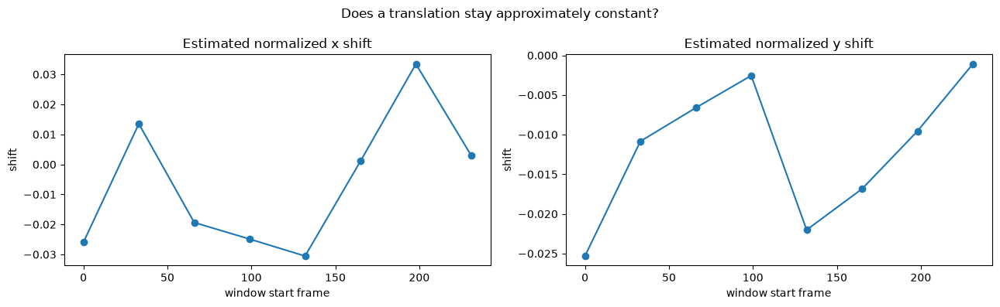

In [10]:
consistency_rows = []
for frame_start in range(0, len(pair_table), max(1, len(pair_table) // 8)):
    frame_end = min(len(pair_table), frame_start + max(1, len(pair_table) // 8))
    frame_subset = correspondence_table[(correspondence_table.rgb_frame >= frame_start) & (correspondence_table.rgb_frame < frame_end)]
    source, target = correspondence_points(frame_subset)
    for name, matrix, errors, inliers in fit_transformations(source, target):
        consistency_rows.append({'frame_start': frame_start, 'frame_end': frame_end - 1, 'transformation': name, 'translation_x': float(matrix[0, 2]), 'translation_y': float(matrix[1, 2]), 'matrix_00': float(matrix[0, 0]), 'matrix_01': float(matrix[0, 1]), 'matrix_10': float(matrix[1, 0]), 'matrix_11': float(matrix[1, 1]), 'mean_error': errors['mean'], 'inliers_or_points': inliers})
consistency_table = pd.DataFrame(consistency_rows)
consistency_table.to_csv(AUDIT_OUTPUT / 'frame_consistency.csv', index=False)
display(consistency_table.head(20))

translation_rows = consistency_table[consistency_table.transformation == 'translation']
if not translation_rows.empty:
    figure, axes = plt.subplots(1, 2, figsize=(13, 4))
    axes[0].plot(translation_rows.frame_start, translation_rows.translation_x, marker='o'); axes[0].set_title('Estimated normalized x shift'); axes[0].set_xlabel('window start frame'); axes[0].set_ylabel('shift')
    axes[1].plot(translation_rows.frame_start, translation_rows.translation_y, marker='o'); axes[1].set_title('Estimated normalized y shift'); axes[1].set_xlabel('window start frame'); axes[1].set_ylabel('shift')
    figure.suptitle('Does a translation stay approximately constant?')
    figure.tight_layout()
    figure.savefig(FIGURE_OUTPUT / 'frame_consistency_translation.png', dpi=140, bbox_inches='tight')
    plt.show()
    plt.close(figure)

### What does this tell us?

A fixed transformation is supported only when its parameters and errors remain reasonably stable across temporal windows. Large changes can mean changing camera geometry, scene parallax, or unreliable box matching. Because this dataset is a sequence, neighboring images are not independent experiments; apparent stability may partly come from temporal continuity.

**Observation:** the CSV and plot show parameter variation by sequence window.

**Interpretation:** stable parameters would support fixed calibration preprocessing; unstable parameters would weaken that case and motivate representation-level methods.

**Conclusion:** frame consistency is a necessary check before adopting one global transform, not an optional refinement.

# Conclusion and Recommended Alignment Strategy

## 1. What we discovered about the dataset

**OBSERVATION:** The notebook discovered `210417_MtErie_Enterprise_VIS_0003` as the RGB folder and `210417_MtErie_Enterprise_IR_0004` as the thermal folder. It found 264 images and 264 YOLO annotation files in each modality. RGB frame identifiers are 0-263, thermal identifiers are 1-264, and the complete pairing rule is `thermal_frame = rgb_frame + 1`.

**INTERPRETATION:** The dataset is a synchronized-looking sequential sequence, not a collection of independent random images. Adjacent frames may be visually very similar.

**CONCLUSION:** Any future train/validation/test split should be sequence-aware. Randomly splitting individual frames could leak near-duplicate neighboring views across partitions.

## 2. What we discovered about RGB/thermal geometry

**OBSERVATION:** RGB images are 3840 x 2160, while thermal images are 640 x 512. The source dimensions and aspect ratios are different.

**INTERPRETATION:** Native RGB and thermal pixel coordinates are not the same coordinate system. Making the arrays the same shape would not prove geometric registration.

**CONCLUSION:** The modalities are not already aligned in the strict pixel-coordinate sense established by this notebook.

## 3. What we discovered about aspect ratio

**OBSERVATION:** RGB aspect ratio is approximately 1.778 and thermal aspect ratio is 1.25. Direct stretching visibly changes the shape of the RGB scene. Aspect-preserving letterboxing keeps shapes but introduces padding.

**CONCLUSION:** Aspect-preserving resizing is required for honest visualization or shared input canvases. It is resolution handling, not camera calibration.

## 4. What we discovered about bounding-box correspondence

**OBSERVATION:** The exploratory normalized-center matcher produced 992 potential correspondences. Mean normalized center displacement was 0.0466, with a maximum of 0.1981. RGB and thermal box sizes also differed slightly in normalized coordinates.

**INTERPRETATION:** Many object centers are broadly related, but the spread and the unverified box identities prevent us from calling these physical point correspondences. The matcher uses proximity and class ID, not person identity.

**CONCLUSION:** Bounding boxes provide useful object-level evidence that the scenes overlap, but they do not alone justify a calibrated pixel mapping.

## 5. What transformation, if any, appears appropriate

**OBSERVATION:** On the pooled exploratory center matches, mean normalized error was 0.0466 with no transformation, 0.0445 after translation, 0.0372 after similarity, 0.0247 after affine, and 0.0260 after homography. Affine and homography used many RANSAC inliers, but these fits are based on heuristic correspondences.

**INTERPRETATION:** The lower affine/homography errors show that a flexible model can fit the selected centers better. They do not show that the same model maps all scene pixels or generalizes across frames. Windowed homography parameters were especially unstable and sometimes extreme.

**CONCLUSION:** Homography is not justified as a final preprocessing choice from this evidence. Affine is a useful comparison baseline, but it also needs independent calibration or manually verified correspondences before deployment.

## 6. What conventional feature matching tells us

**OBSERVATION:** ORB found many raw descriptor matches, but the sampled frames retained only 8-30 RANSAC-consistent matches from the 100 selected low-distance matches.

**INTERPRETATION:** Ordinary RGB-style local descriptors can find repeated texture in the forest and terrain, but the limited and variable inlier counts do not establish reliable cross-modal registration.

**CONCLUSION:** Conventional ORB matching is useful as a diagnostic, but it is not sufficiently trustworthy here as the sole registration method.

## 7. Do we need geometric alignment?

**CONCLUSION:** We need explicit resolution and aspect-ratio handling. A fixed geometric alignment may be useful, but this notebook does not prove that one global translation, similarity, affine transform, or homography is valid for all frames.

## 8. Do we need feature-level alignment?

**INTERPRETATION:** The different resolutions, different fields of view/aspect ratios, changing window estimates, and weak conventional feature evidence make feature-level alignment worth investigating. This is not a claim that a learned module is already necessary; it is the next hypothesis to test after stronger calibration evidence is considered.

## 9. Recommended architecture for our project

**RECOMMENDATION:** Use aspect-preserving preprocessing for each modality, keep the RGB and thermal streams in explicitly separate coordinate systems, and investigate a combination of modest geometric normalization plus feature-level alignment before cross-modal fusion. Treat any affine calibration as a separately validated baseline rather than assuming it is correct. Do not use an unverified homography as the default.

This recommendation separates four decisions: resizing controls computational resolution, letterboxing controls display/input aspect ratio, calibration controls camera geometry, and feature-level alignment controls learned cross-modal representation. None of these decisions is the fusion model itself.

## 10. Limitations and remaining uncertainty

This investigation has no camera calibration file, no manually verified landmark correspondences, and no guaranteed identity matching between RGB and thermal annotation rows. The center-based matching heuristic can create false pairs, and the sequence is limited to one scene/flight sequence. The transformation errors are therefore exploratory, not a calibrated measurement of physical reprojection error.

**FINAL CONCLUSION:** The evidence indicates overlapping RGB and thermal views with meaningful object-level correspondence, but not already registered pixel grids. A stable fixed transformation is not established, conventional ORB matching is unreliable as a sole method, and a combination of aspect-preserving preprocessing, calibration validation, and feature-level alignment is the most defensible next research direction. This notebook does not implement or choose the final deep-learning fusion model.